In [ ]:
print("Start the Notebook")

Start the Notebook


In [ ]:
cd /content/drive/MyDrive/Tensorflow Developer/Ai image to text

/content/drive/MyDrive/Tensorflow Developer/Ai image to text


In [ ]:
pwd

'/content/drive/MyDrive/Tensorflow Developer/Ai image to text'

In [ ]:
!nvidia-smi

Tue Sep 20 16:17:43 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8    12W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install diffusers==0.3.0
!pip install transformers scipy ftfy
!pip install "ipywidgets>=7,<8"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

Login successful
Your token has been saved to /root/.huggingface/token
Authenticated through git-credential store but this isn't the helper defined on your machine.
You might have to re-authenticate when pushing to the Hugging Face Hub. Run the following command in your terminal in case you want to set this credential helper as the default

git config --global credential.helper store


In [ ]:
import torch
from diffusers import StableDiffusionPipeline

# make sure you're logged in with `huggingface-cli login`
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16, use_auth_token=True)  

{'trained_betas'} was not found in config. Values will be initialized to default values.


In [ ]:
pipe = pipe.to("cuda")

  0%|          | 0/51 [00:00<?, ?it/s]

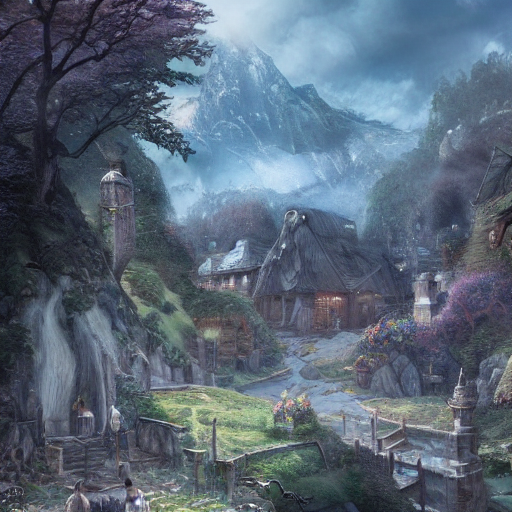

In [ ]:
from torch import autocast
generator = torch.Generator("cuda").manual_seed(1024)
prompt = "A village like Lord of the rings, Beautiful fantasy lands, illustrated in a realistic and detailed style by wei wang, artstation, most realistic, 4k"
with autocast("cuda"):
  image = pipe(prompt).images[0]  # image here is in [PIL format](https://pillow.readthedocs.io/en/stable/)

# Now to display an image you can do either save it such as:
image.save(f"ajaira1.png")

# or if you're in a google colab you can directly display it with 
image

  0%|          | 0/101 [00:00<?, ?it/s]

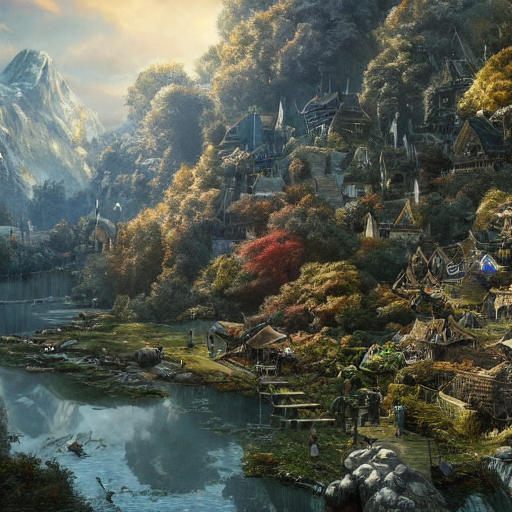

In [ ]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

with autocast("cuda"):
  image = pipe(prompt, num_inference_steps=100, generator=generator).images[0]

image

  0%|          | 0/200 [00:00<?, ?it/s]

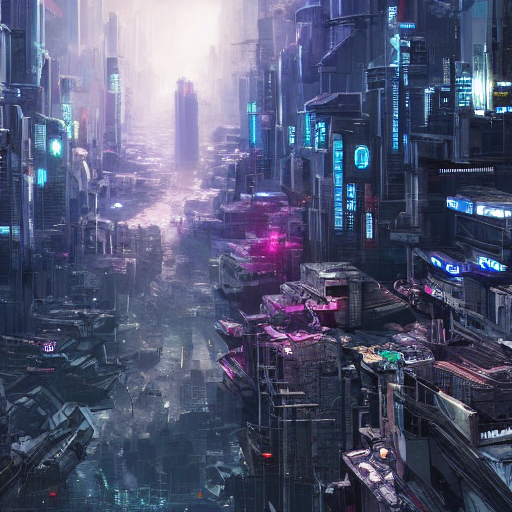

In [ ]:
from torch import autocast
from diffusers import StableDiffusionPipeline, LMSDiscreteScheduler
generator = torch.Generator("cuda").manual_seed(1024)

model_id = "CompVis/stable-diffusion-v1-4"

scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)
pipe = StableDiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, use_auth_token=True)
pipe = pipe.to("cuda")


prompt = ["Dhaka City in 4000, A cyberpunk CIty of Future, City Future Science Fiction worlds, advanced technology, City like Star Wars, Cyberpunk, modern world, everythings got advanced technology, heavy use of lights and shadows,  illustrated in a realistic and detailed style by wei wang, artstation, most realistic ,4k ,HD"]
with autocast("cuda"):
  image = pipe(prompt, num_inference_steps=200, generator=generator, guidance_scale=7.5).images[0]  # image here is in [PIL format](https://pillow.readthedocs.io/en/stable/)

# Now to display an image you can do either save it such as:
image.save(f"scenary.png")

# or if you're in a google colab you can directly display it with 
image

  0%|          | 0/20 [00:00<?, ?it/s]

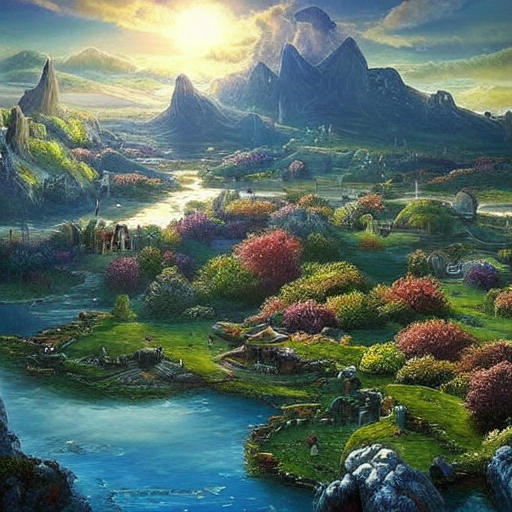

In [ ]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

with autocast("cuda"):
  image = pipe(prompt, num_inference_steps=20, generator=generator).images[0]

image

<h1> For generating multiple images </h2>

In [ ]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/51 [00:00<?, ?it/s]

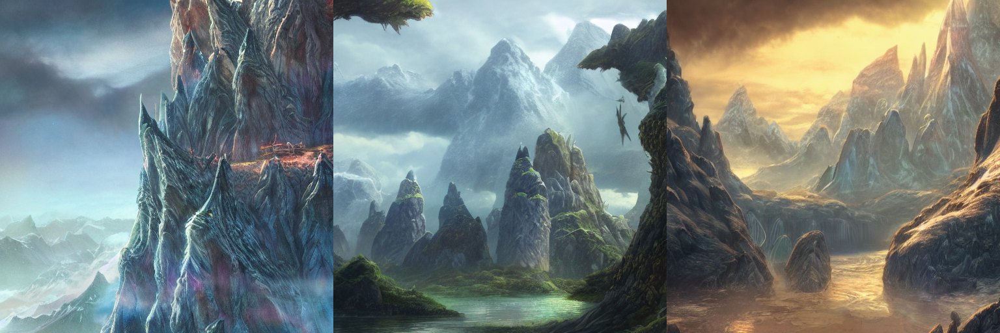

In [ ]:
num_images = 3
prompt = ["A lands like Asgard, Norse Mythology, Beautiful fantasy lands, illustrated in a realistic and detailed style by wei wang, artstation, most realistic, 4k"] * num_images


#prompt = ["a mars rover landed on mars, 4k"] * num_images

with autocast("cuda"):
  images = pipe(prompt, generator=generator).images

grid = image_grid(images, rows=1, cols=3)
grid

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

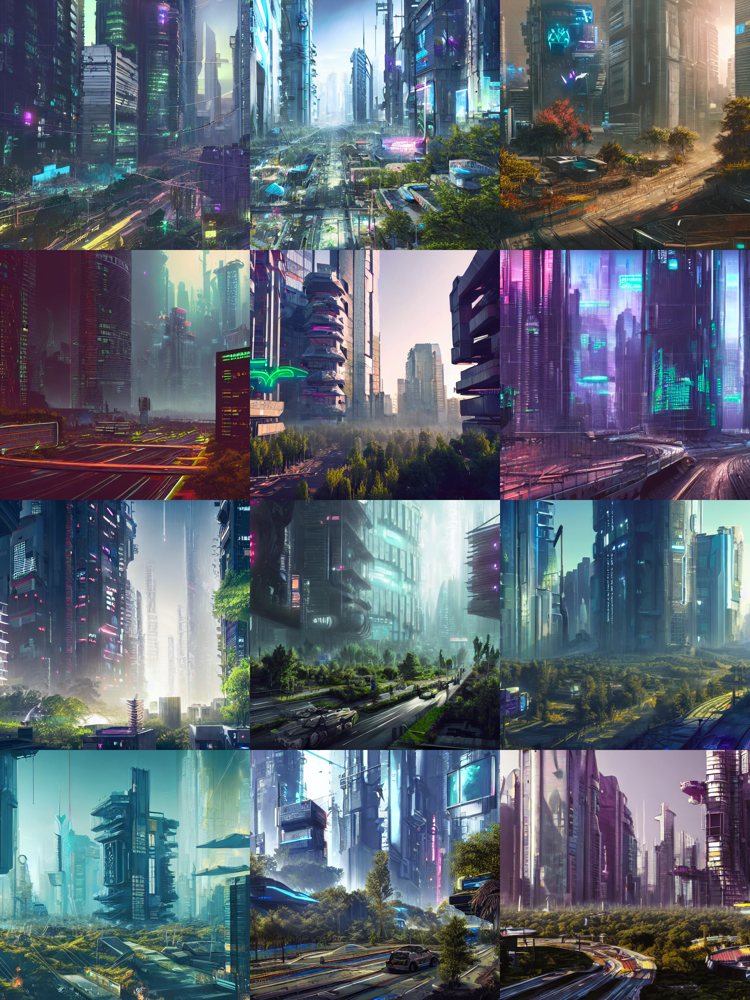

In [ ]:
num_cols = 3
num_rows = 4

prompt = ["a cyberpunk cityscape in the future, overtaken by vegetation,trending on artstation, most realistic, 4k"] * num_cols

all_images = []
for i in range(num_rows):
  with autocast("cuda"):
    images = pipe(prompt).images
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid

<h1>Generate non square image </h1>

  0%|          | 0/51 [00:00<?, ?it/s]

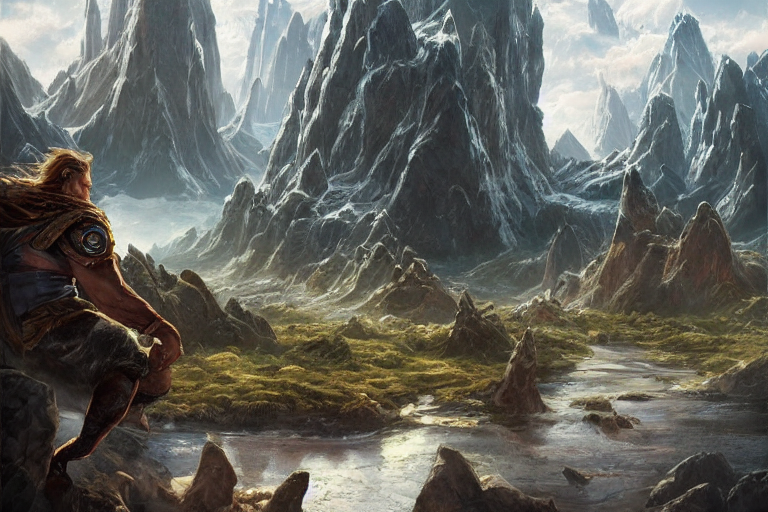

In [ ]:
prompt = "A beautiful fantasy lands like Asgard, Norse Mythology, illustrated in a realistic and detailed style by wei wang, artstation, most realistic, 4k"
with autocast("cuda"):
  image = pipe(prompt, height=512, width=768).images[0]
image